In [1]:
import os
import h2o
import pandas as pd
import numpy as np
from h2o.automl import H2OAutoML
import tools
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import StratifiedKFold

In [2]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.8.0_341"; Java(TM) SE Runtime Environment (build 1.8.0_341-b10); Java HotSpot(TM) 64-Bit Server VM (build 25.341-b10, mixed mode)
  Starting server from /Users/aaran/opt/anaconda3/envs/tensorflow/lib/python3.10/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/yv/fxtprh2s52j94nnjg1219s_w0000gn/T/tmpr3wulb9m
  JVM stdout: /var/folders/yv/fxtprh2s52j94nnjg1219s_w0000gn/T/tmpr3wulb9m/h2o_aaran_started_from_python.out
  JVM stderr: /var/folders/yv/fxtprh2s52j94nnjg1219s_w0000gn/T/tmpr3wulb9m/h2o_aaran_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,America/Toronto
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.38.0.4
H2O_cluster_version_age:,2 months and 1 day
H2O_cluster_name:,H2O_from_python_aaran_6ii0r9
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.542 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [3]:
#load data
df = pd.read_csv('duke_vital_model_imputed.csv')
df.head()
df["PostCond"].value_counts()

1    62257
0    21063
Name: PostCond, dtype: int64

In [4]:
def filterer(pair):
    key, value = pair
    if len(value) >= 2:
        return True
    return False

In [5]:
trends = tools.return_trends(df, [[2], [3], [4], [5], [6], [7], [8], [9], [10], [11], [12], [13]], ["DIASBP_R", "PULSE_R", "SYSBP_R", "WEIGHT_R", "CREATININE_R", "HDL_R", "LDL_R", "TOTCHOL_R", "wbc", "gluc", "tprot", "alb", "ast", "alt", "tbil", "cr", "ptinr"])
train_col_names = list(df.drop(labels=["RSUBJID", "PostCond"], axis=1).keys())
imputer = IterativeImputer(random_state=42)
X_train_for_imputed = imputer.fit_transform(df.drop(labels=["RSUBJID", "PostCond"], axis=1).to_numpy())
imputed_train_df = pd.DataFrame(X_train_for_imputed, columns=train_col_names)
imputed_train_df["RSUBJID"] = df["RSUBJID"]
imputed_train_df["PostCond"] = df["PostCond"]
imputed_train_subj_dict = tools.create_subj_dict(imputed_train_df)
filtered_imputed_train_subj_dict = dict(filter(filterer, imputed_train_subj_dict.items()))
normalized_train_dict = tools.dist_from_age_mean(filtered_imputed_train_subj_dict, trends)
linearized_train_dict = tools.dict_to_linfit(normalized_train_dict, trend_cols=["DIASBP_R", "PULSE_R", "SYSBP_R", "WEIGHT_R", "CREATININE_R", "HDL_R", "LDL_R", "TOTCHOL_R", "wbc", "gluc", "tprot", "alb", "ast", "alt", "tbil", "cr", "ptinr"])
linearized_train_df = tools.lin_dict_to_df(linearized_train_dict)
X = linearized_train_df.drop(labels=["RSUBJID"], axis=1)


/var/folders/yv/fxtprh2s52j94nnjg1219s_w0000gn/T/ipykernel_18986/1705722016.py:11: RankWarning: Polyfit may be poorly conditioned
  linearized_train_dict = tools.dict_to_linfit(normalized_train_dict, trend_cols=["DIASBP_R", "PULSE_R", "SYSBP_R", "WEIGHT_R", "CREATININE_R", "HDL_R", "LDL_R", "TOTCHOL_R", "wbc", "gluc", "tprot", "alb", "ast", "alt", "tbil", "cr", "ptinr"])
/var/folders/yv/fxtprh2s52j94nnjg1219s_w0000gn/T/ipykernel_18986/1705722016.py:11: RankWarning: Polyfit may be poorly conditioned
  linearized_train_dict = tools.dict_to_linfit(normalized_train_dict, trend_cols=["DIASBP_R", "PULSE_R", "SYSBP_R", "WEIGHT_R", "CREATININE_R", "HDL_R", "LDL_R", "TOTCHOL_R", "wbc", "gluc", "tprot", "alb", "ast", "alt", "tbil", "cr", "ptinr"])
/var/folders/yv/fxtprh2s52j94nnjg1219s_w0000gn/T/ipykernel_18986/1705722016.py:11: RankWarning: Polyfit may be poorly conditioned
  linearized_train_dict = tools.dict_to_linfit(normalized_train_dict, trend_cols=["DIASBP_R", "PULSE_R", "SYSBP_R", "WEIGH

In [6]:
categorical_columns = ["RACE_G", "GENDER", "HXCOPD", "HXDIAB", "HXHTN", "HXHYL", "HXSMOKE"]

X["RACE_G"] = X["RACE_G"].astype(int)

X = h2o.H2OFrame(X)

X["RACE_G"] = X["RACE_G"].asfactor()
X["GENDER"] = X["GENDER"].asfactor()
X["HXCOPD"] = X["HXCOPD"].asfactor()
X["HXDIAB"] = X["HXDIAB"].asfactor()
X["HXHTN"] = X["HXHTN"].asfactor()
X["HXHYL"] = X["HXHYL"].asfactor()
X["HXSMOKE"] = X["HXSMOKE"].asfactor()
X["PostCond"] = X["PostCond"].asfactor()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [7]:
train, test = X.split_frame(ratios=[0.8], seed = 1)
aml = H2OAutoML(max_models =25,
                balance_classes=True,
		seed =1)

aml.train(training_frame = X, y = 'PostCond')


AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_AllModels_1_AutoML_1_20230307_10059

No summary for this model

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.09358402462258374
RMSE: 0.3059150611241358
LogLoss: 0.3196965069662539
AUC: 0.9733608465526548
AUCPR: 0.992456949793568
Gini: 0.9467216931053095
Null degrees of freedom: 10056
Residual degrees of freedom: 10034
Null deviance: 10923.893822216298
Residual deviance: 6430.375541119231
AIC: 6476.375541119231

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6708375372235741
       0     1     Error    Rate
-----  ----  ----  -------  ---------------
0      2073  272   0.116    (272.0/2345.0)
1      262   7450  0.034    (262.0/7712.0)
Total  2335  7722  0.0531   (534.0/10057.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.670838     0.965401  220
max f2                       0.648319     0.968899  230
max f0point5                 0.706069     0.97252   201
max accuracy                 0.678406     0.947002  216
max precision                0.995896     1         0
max recall                   0.223292     1         377
max specificity              0.995896     1         0
max absolute_mcc             0.686346     0.854088  212
max min_per_class_accuracy   0.707893     0.939575  200
max mean_per_class_accuracy  0.706069     0.940121  201
max tns                      0.995896     2345      0
max fns                      0.995896     7702      0
max fps                      0.146684     2345      399
max tps                      0.223292     7712      377
max tnr                      0.995896     1         0
max fnr                      0.995896     0.998703  0
max fpr                      0.146684     1         399
max tpr                      0.223292     1         377

Gains/Lift Table: Avg response rate: 76.68 %, avg score: 75.54 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100428                   0.97749            1.30407    1.30407            1                0.983053  1                           0.983053            0.0130965       0.0130965                  30.4072   30.4072            0.0130965
2        0.0200855                   0.971402           1.30407    1.30407            1                0.974253  1                           0.978653            0.0130965       0.0261929                  30.4072   30.4072            0.0261929
3        0.0300288                   0.967169           1.30407    1.30407            1                0.969234  1                           0.975534            0.0129668       0.0391598                  30.4072   30.4072            0.0391598
4        0.0400716                   0.962695           1.30407    1.30407            1                0.964935  1                           0.972878            0.0130965       0.0522562                  30.4072   30.4072            0.0522562
5        0.0500149                   0.957987           1.30407    1.30407            1                0.960133  1                           0.970344            0.0129668       0.065223                   30.4072   30.4072            0.065223
6        0.10003                     0.932494           1.30407    1.30407            1                0.945157  1                           0.957751            0.065223        0.130446                   30.40

In [8]:
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_1_AutoML_1_20230307_10059,0.731878,0.468831,0.887207,0.388481,0.387113,0.149856
StackedEnsemble_BestOfFamily_1_AutoML_1_20230307_10059,0.728912,0.46959,0.886179,0.38805,0.387373,0.150058
GBM_5_AutoML_1_20230307_10059,0.723862,0.473407,0.882989,0.388309,0.388965,0.151293
GBM_grid_1_AutoML_1_20230307_10059_model_2,0.721757,0.473285,0.882988,0.388193,0.38911,0.151406
GBM_1_AutoML_1_20230307_10059,0.720471,0.4759,0.881635,0.388107,0.389883,0.152009
GBM_2_AutoML_1_20230307_10059,0.719332,0.47534,0.87995,0.388232,0.389582,0.151774
GBM_grid_1_AutoML_1_20230307_10059_model_3,0.718534,0.475182,0.881612,0.388413,0.389935,0.152049
GBM_3_AutoML_1_20230307_10059,0.717743,0.476772,0.879606,0.388366,0.390045,0.152135
GBM_4_AutoML_1_20230307_10059,0.71424,0.482163,0.877022,0.389746,0.391897,0.153583
XGBoost_3_AutoML_1_20230307_10059,0.711567,0.568642,0.87592,0.388561,0.438602,0.192372


In [9]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_AllModels_1_AutoML_1_20230307_10059

No summary for this model

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.09358402462258374
RMSE: 0.3059150611241358
LogLoss: 0.3196965069662539
AUC: 0.9733608465526548
AUCPR: 0.992456949793568
Gini: 0.9467216931053095
Null degrees of freedom: 10056
Residual degrees of freedom: 10034
Null deviance: 10923.893822216298
Residual deviance: 6430.375541119231
AIC: 6476.375541119231

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6708375372235741
       0     1     Error    Rate
-----  ----  ----  -------  ---------------
0      2073  272   0.116    (272.0/2345.0)
1      262   7450  0.034    (262.0/7712.0)
Total  2335  7722  0.0531   (534.0/10057.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f

In [10]:
best_model.model_performance(test)

ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.09369141532910069
RMSE: 0.3060905345303913
LogLoss: 0.3203977071501704
AUC: 0.9732695738776409
AUCPR: 0.9925578577337947
Gini: 0.9465391477552818
Null degrees of freedom: 3343
Residual degrees of freedom: 3321
Null deviance: 3630.544821896753
Residual deviance: 2142.8198654203397
AIC: 2188.8198654203397

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6674617042008799
       0    1     Error    Rate
-----  ---  ----  -------  --------------
0      688  91    0.1168   (91.0/779.0)
1      84   2481  0.0327   (84.0/2565.0)
Total  772  2572  0.0523   (175.0/3344.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.667462     0.965933  226
max f2                       0.657328     0.967416  231
max f0point5                 0.716367     0.971597  202
max accuracy                 0.667462     0.947667  226
max precision                0.996409     1         0
max recall                   0.234751     1         371
max specificity              0.996409     1         0
max absolute_mcc             0.667462     0.853119  226
max min_per_class_accuracy   0.705054     0.934893  208
max mean_per_class_accuracy  0.716367     0.937736  202
max tns                      0.996409     779       0
max fns                      0.996409     2564      0
max fps                      0.140099     779       399
max tps                      0.234751     2565      371
max tnr                      0.996409     1         0
max fnr                      0.996409     0.99961   0
max fpr                      0.140099     1         399
max tpr                      0.234751     1         371

Gains/Lift Table: Avg response rate: 76.70 %, avg score: 75.28 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0101675                   0.977536           1.3037     1.3037             1                0.982899  1                           0.982899            0.0132554       0.0132554                  30.3704   30.3704            0.0132554
2        0.0200359                   0.973547           1.3037     1.3037             1                0.975676  1                           0.979342            0.0128655       0.0261209                  30.3704   30.3704            0.0261209
3        0.0302033                   0.968058           1.3037     1.3037             1                0.970646  1                           0.976414            0.0132554       0.0393762                  30.3704   30.3704            0.0393762
4        0.0400718                   0.964088           1.3037     1.3037             1                0.965877  1                           0.973819            0.0128655       0.0522417                  30.3704   30.3704            0.0522417
5        0.0502392                   0.958304           1.3037     1.3037             1                0.961154  1                           0.971256            0.0132554       0.0654971                  30.3704   30.3704            0.0654971
6        0.100179                    0.933041           1.3037     1.3037             1                0.94578   1                           0.958556            0.0651072       0.130604                   30.3704   30.3704            0.130604
7        0.15012                     0.912877           1.3037     1.3037             1                0.922042  1                           0.

In [11]:
model_path = h2o.save_model(model=best_model,path='/Users/aaran/MHA_Upload_my_changes/Duke_Dataset/slope_model', force=True)
print(model_path)


/Users/aaran/MHA_Upload_my_changes/Duke_Dataset/slope_model/StackedEnsemble_AllModels_1_AutoML_1_20230307_10059


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_1_AutoML_1_20230307_10059_model_1,0.988333,0.2246,0.996618,0.0484192,0.24168,0.0584094,6274,0.008817,XGBoost
DRF_1_AutoML_1_20230307_10059,0.988041,0.188181,0.996893,0.011501,0.221894,0.0492371,3413,0.013296,DRF
XRT_1_AutoML_1_20230307_10059,0.987001,0.200639,0.996642,0.011306,0.231954,0.0538028,4153,0.016156,DRF
GBM_grid_1_AutoML_1_20230307_10059_model_1,0.982998,0.265848,0.9957,0.0212333,0.282218,0.0796472,1644,0.01155,GBM
XGBoost_grid_1_AutoML_1_20230307_10059_model_5,0.976977,0.230125,0.993024,0.0842058,0.252239,0.0636247,4727,0.008055,XGBoost
XGBoost_grid_1_AutoML_1_20230307_10059_model_3,0.976342,0.250176,0.992914,0.0707507,0.263043,0.0691917,9281,0.012145,XGBoost
StackedEnsemble_BestOfFamily_1_AutoML_1_20230307_10059,0.975035,0.316318,0.993225,0.0659012,0.303882,0.0923444,7711,0.044519,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20230307_10059,0.97327,0.320398,0.992558,0.0747825,0.306091,0.0936914,15469,0.14126,StackedEnsemble
GBM_grid_1_AutoML_1_20230307_10059_model_4,0.973208,0.321964,0.992763,0.0798507,0.315176,0.0993356,1539,0.014356,GBM
XGBoost_grid_1_AutoML_1_20230307_10059_model_2,0.96441,0.273739,0.989059,0.102672,0.28024,0.0785345,4782,0.011779,XGBoost


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_AllModels_1_AutoML_1_20230307_10059

,0,1,Error,Rate
0,688.0,91.0,0.1168,(91.0/779.0)
1,84.0,2481.0,0.0327,(84.0/2565.0)
Total,772.0,2572.0,0.0523,(175.0/3344.0)


# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

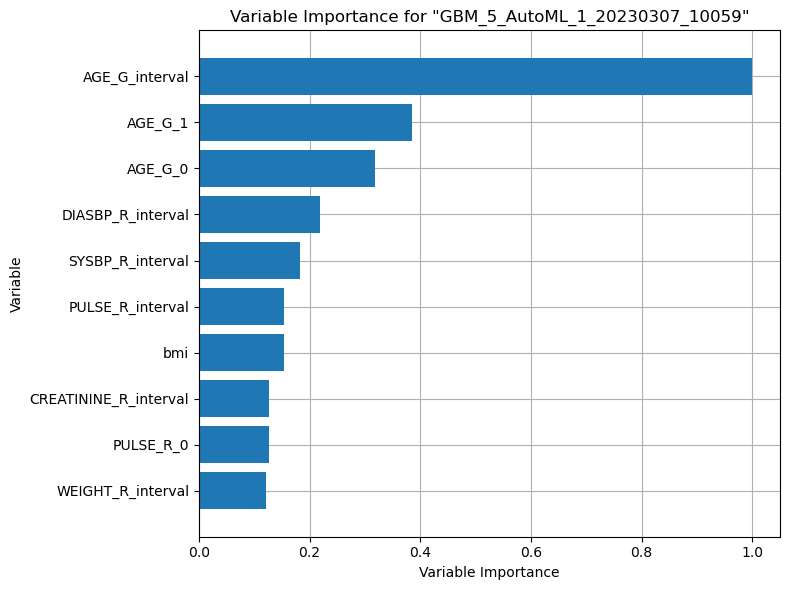

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

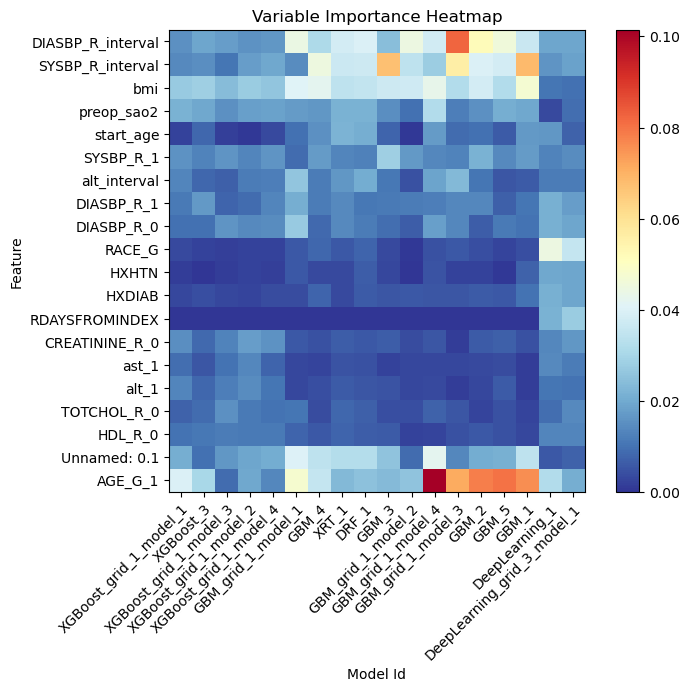

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

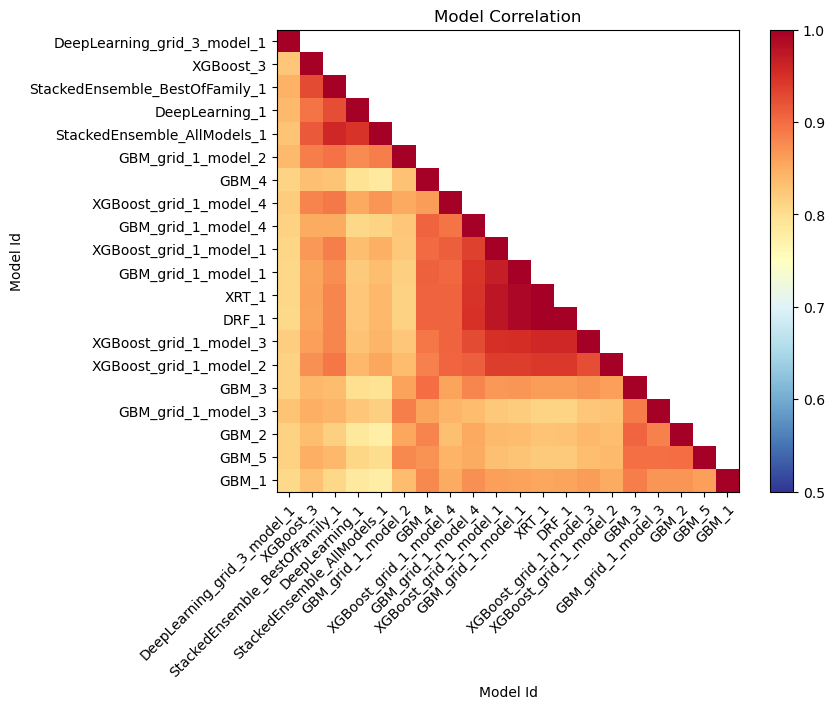

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

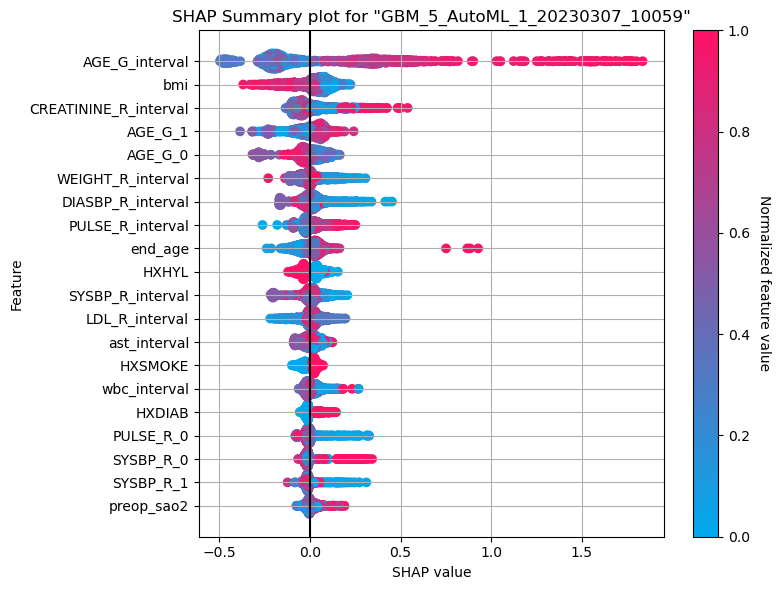

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

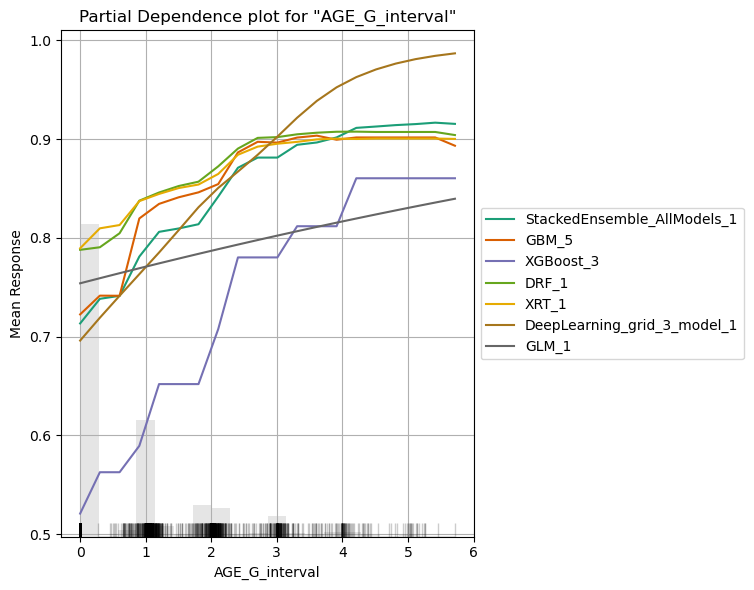

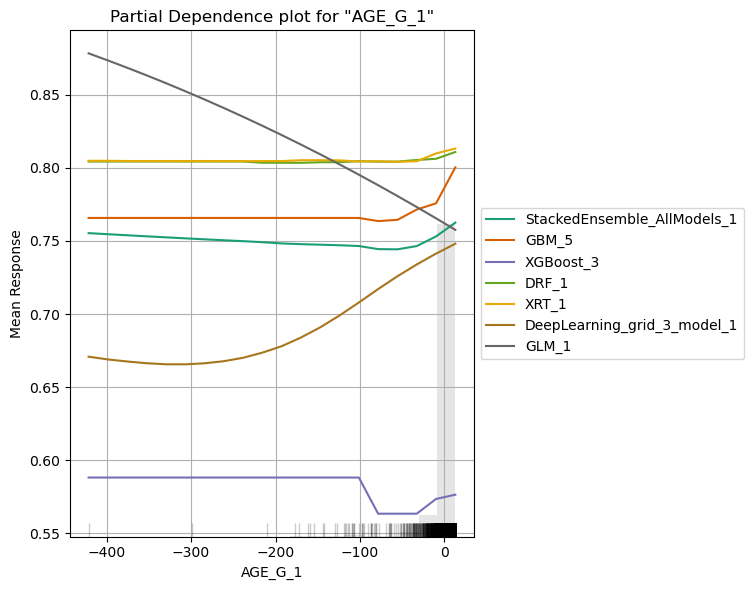

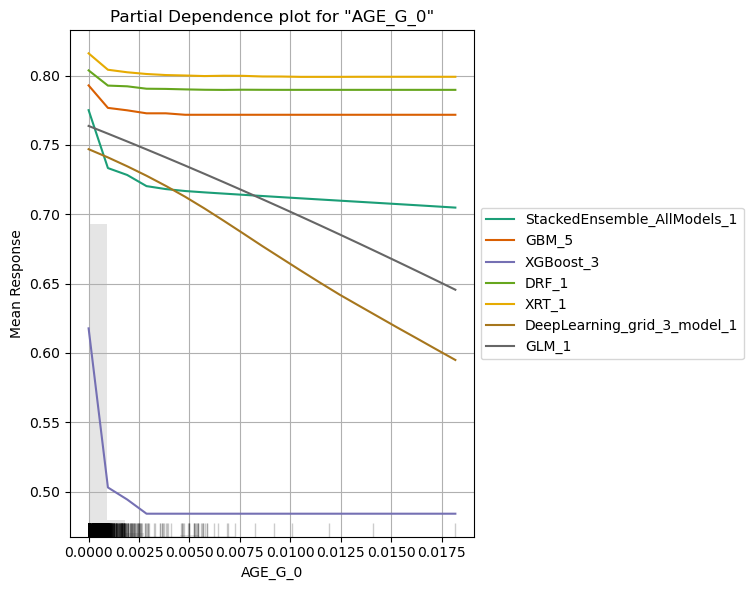

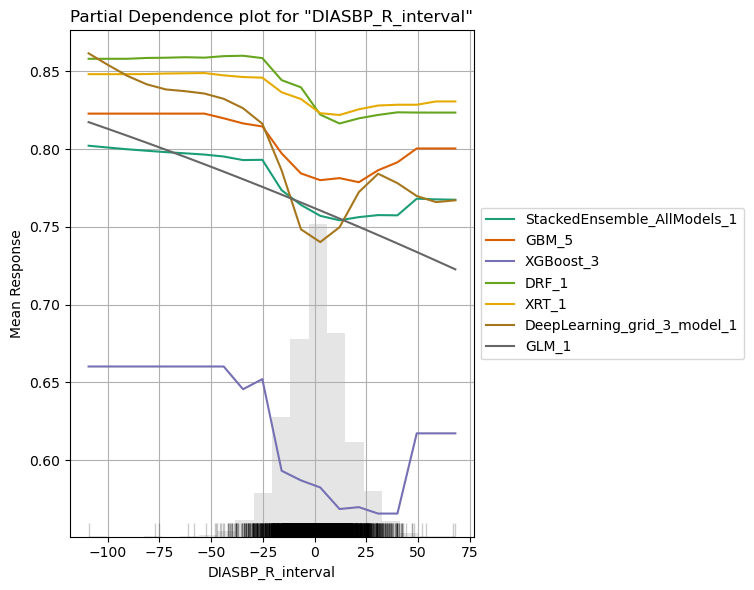

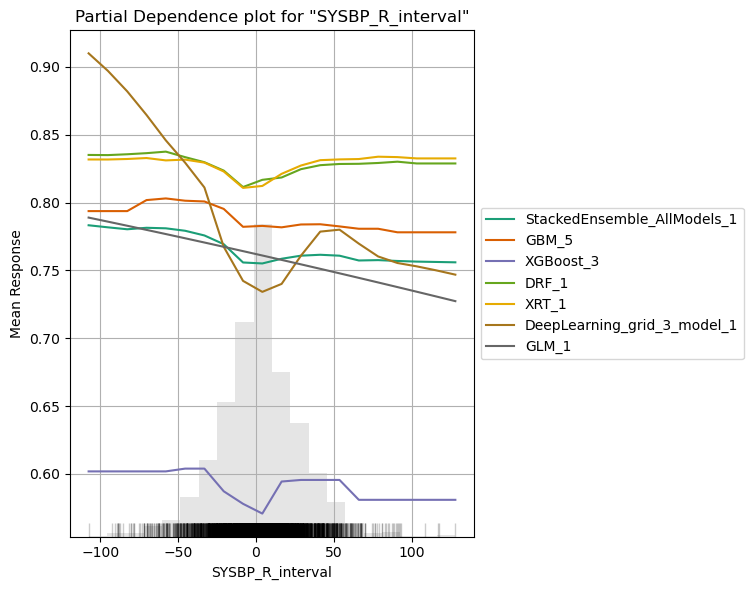

In [12]:
explain_model = aml.explain(frame = test, figsize = (8,6))